In [ ]:
https://data.nashville.gov/Transportation/Sidewalk-Inventory-for-ADA-Self-Assessment/vpxc-b5te
    https://data.nashville.gov/General-Government/Business-Improvement-District-Boundaries-GIS-/peu8-zsat

In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [7]:
imp = gpd.read_file('../mini/improvement.geojson')
print(imp.crs)
imp.head( )

epsg:4326


,area,name,shape_stle,modify_date,objectid,id,shape_star,ordinance,est_date,geometry
0,0.598798093482,Central Business Improvement District,20206.6011162,2017-03-08T00:00:00+00:00,2,0,16693465.9932,BL2017-580,1998-02-06T00:00:00+00:00,"MULTIPOLYGON (((-86.78557 36.15742, -86.78417 ..."
1,0.145317848102,Gulch Business Improvement District,0,2016-01-06T00:00:00+00:00,0,0,0,BL2015-67,2006-08-16T00:00:00+00:00,"MULTIPOLYGON (((-86.78457 36.15520, -86.78457 ..."


In [8]:
type(imp)

geopandas.geodataframe.GeoDataFrame

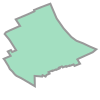

In [9]:
imp.loc[0,'geometry']

In [10]:
print(imp.loc[0,'geometry'])

MULTIPOLYGON (((-86.78556828224605 36.15742349202315, -86.78416837601885 36.15801103368565, -86.78474871699042 36.15890091490335, -86.78411999277336 36.1591763151, -86.78394933155936 36.15890930892427, -86.7838760442809 36.15879468236198, -86.78307249166207 36.1591370159372, -86.78422165920674 36.16093865142265, -86.78448739272328 36.16133596256905, -86.78537081151327 36.1623977082226, -86.78513272153505 36.16272541773114, -86.78434356324522 36.16311857801987, -86.78245428112328 36.16395262661768, -86.78228230637696 36.16400619682027, -86.78315787631591 36.16532936313191, -86.78070980643865 36.16635934206258, -86.77940599146108 36.16694882711441, -86.77948901072972 36.16720650200664, -86.77798547648585 36.1678106851173, -86.77622367863492 36.16846896575727, -86.7749657500427 36.16552212097163, -86.77356619041494 36.16352034757094, -86.77201849725228 36.16179926246247, -86.7710031655436 36.16105036032884, -86.76965429173858 36.16052623217986, -86.76830426083974 36.15988101904475, -86.76

<AxesSubplot:>

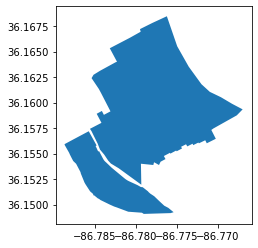

In [11]:
imp.plot()

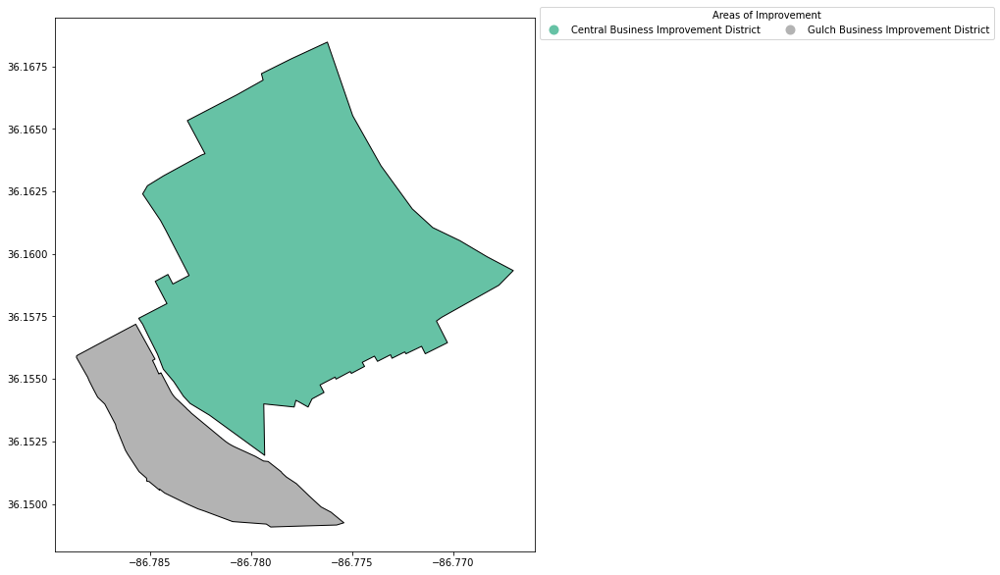

In [13]:
#geopandas handles legend styling if you pass a dict of keywords

leg_kwds = {'title': 'Areas of Improvement', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

imp.plot(column = 'name', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [98]:
sidewalks = gpd.read_file('../mini/sidewalks.geojson')
print(sidewalks.crs)
sidewalks.head(20)

epsg:4326


,evnt_lat,obj_pot,side,measure,curbtype,evnt_lon,sw_mat_ty,drv_ld,cr_slp,event_subt,...,drv_ti_mat,from,obj_hgt,cr_slp_d,routeid,drv_cs,obj_type,onst,tost,geometry
0,36.08965518,None,S,892,None,-86.62350564,None,0,None,None,...,None,Bell Rd,None,None,8600,None,None,Smith Springs Rd,Rural Hill Rd,POINT (-86.62351 36.08966)
1,36.16262,None,W,390.4704334,None,-86.81184584,None,0,0,FLUSH,...,None,Morena St,None,None,93,0,BIKE FRIENDLY,24th Ave N,Herman St,POINT (-86.81185 36.16262)
2,36.16528346,None,N,161,None,-86.81559108,None,0,None,POINT,...,None,26th Ave N,None,None,26,None,HC-L,Albion St,25th Ave N,POINT (-86.81559 36.16528)
3,36.16549622,None,S,425,None,-86.81060602,None,-1,None,None,...,GRAVEL,24th Ave N,None,None,36,7.4,RESDRW-MID,Albion St,21st Ave N,POINT (-86.81061 36.16550)
4,36.16658087,"LESS THAN 32""",N,218,None,-86.81150264,None,0,None,None,...,None,24th Ave N,None,None,4,None,VEGPT,Alameda St,21st Ave N,POINT (-86.81150 36.16658)
5,36.1533134,None,S,854,None,-86.82063893,None,0,None,POINT,...,None,33rd Ave N,None,None,94,None,SD-L,Charlotte Ave,28th Ave N,POINT (-86.82064 36.15331)
6,36.16110737,None,S,0,POST,-86.81756311,CONCRETE,0,1.7,None,...,None,27th Ave N,None,TOROAD,54,None,BEG_SW_ODR,Batavia St,26th Ave N,POINT (-86.81756 36.16111)
7,36.15939879,None,E,520,None,-86.81502033,None,0,None,POINT,...,None,Booker St,None,None,67,None,JOINTSEP-L,26th Ave N,Clifton Ave,POINT (-86.81502 36.15940)
8,36.16479375,None,W,65,None,-86.81806645,None,0,None,POINT,...,None,Albion St,None,None,41,None,JOINTFLT-L,27th Ave N,Eden St,POINT (-86.81807 36.16479)
9,36.15871204,None,W,588,POST,-86.81760916,CONCRETE,0,1.9,None,...,None,Booker St,None,TOROAD,63,None,END_SW_ODR,Lena St,Clifton Ave,POINT (-86.81761 36.15871)


In [21]:
sidewalks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 188344 entries, 0 to 188343
Data columns (total 25 columns):
 #   Column      Non-Null Count   Dtype   
---  ------      --------------   -----   
 0   evnt_lat    188344 non-null  object  
 1   obj_pot     11552 non-null   object  
 2   side        188283 non-null  object  
 3   measure     188344 non-null  object  
 4   curbtype    32047 non-null   object  
 5   evnt_lon    188344 non-null  object  
 6   sw_mat_ty   31995 non-null   object  
 7   drv_ld      188344 non-null  object  
 8   cr_slp      35179 non-null   object  
 9   event_subt  107461 non-null  object  
 10  drv_cs_d    17339 non-null   object  
 11  repaired    188344 non-null  object  
 12  fur_zn_w    188344 non-null  object  
 13  sw_width    188344 non-null  object  
 14  evnt_type   188342 non-null  object  
 15  drv_ti_mat  17287 non-null   object  
 16  from        188344 non-null  object  
 17  obj_hgt     598 non-null     object  
 18  cr_slp_d    3315

In [52]:
imp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [45]:
sidewalks_geo = gpd.GeoDataFrame(sidewalks, 
                           crs = imp.crs, 
                           geometry = sidewalks['geometry'])

In [46]:
type(sidewalks_geo)

geopandas.geodataframe.GeoDataFrame

In [47]:
imp = imp[['name', 'geometry']]

In [48]:
sidewalks_out_in_improvement_area = gpd.sjoin(sidewalks_geo, imp, op = 'within')

In [49]:
sidewalks_out_in_improvement_area.head()

,evnt_lat,obj_pot,side,measure,curbtype,evnt_lon,sw_mat_ty,drv_ld,cr_slp,event_subt,...,obj_hgt,cr_slp_d,routeid,drv_cs,obj_type,onst,tost,geometry,index_right,name
15858,36.14921978,None,W,136,None,-86.77924271,None,0,None,POINT,...,None,None,937,None,SD-L,8th Ave S,South St,POINT (-86.77924 36.14922),1,Gulch Business Improvement District
16150,36.1492046,None,W,141,None,-86.7792419,None,0,None,"1/2"" TO 1""",...,None,None,937,None,NOT BIKE FRIENDLY,8th Ave S,South St,POINT (-86.77924 36.14920),1,Gulch Business Improvement District
16168,36.15091764,None,W,28,None,-86.78444558,None,0,None,"2"" TO 6""",...,None,None,925,None,NOT BIKE FRIENDLY,12th Ave S,Hawkins St,POINT (-86.78445 36.15092),1,Gulch Business Improvement District
16323,36.15099294,None,S,1471,24_IN,-86.78445758,CONCRETE,0,.4,None,...,None,TOROAD,890,None,END_SW_NWR,Division St,12th Ave S,POINT (-86.78446 36.15099),1,Gulch Business Improvement District
16517,36.15093377,None,W,22,None,-86.78444364,None,0,None,POINT,...,None,None,925,None,JOINTFLT-L,12th Ave S,Hawkins St,POINT (-86.78444 36.15093),1,Gulch Business Improvement District


In [57]:
sidewalks_out_in_improvement_area['name'].value_counts()

Central Business Improvement District    3627
Gulch Business Improvement District       970
Name: name, dtype: int64

In [62]:
sidewalks_in_cbid = sidewalks_out_in_improvement_area.loc[sidewalks_out_in_improvement_area['name'] == 'Central Business Improvement District']
sidewalks_in_cbid.shape
sidewalks_in_cbid.head()

,evnt_lat,obj_pot,side,measure,curbtype,evnt_lon,sw_mat_ty,drv_ld,cr_slp,event_subt,...,obj_hgt,cr_slp_d,routeid,drv_cs,obj_type,onst,tost,geometry,index_right,name
38479,36.16686548,None,W,1374,None,-86.77684351,None,0,None,POINT,...,None,None,1987,None,FC-L,Gay St,1st Ave N,POINT (-86.77684 36.16687),0,Central Business Improvement District
38507,36.16611531,None,W,1662,None,-86.77653028,None,0,None,POINT,...,None,None,1987,None,FC-L,Gay St,1st Ave N,POINT (-86.77653 36.16612),0,Central Business Improvement District
38590,36.16616334,None,W,1643,None,-86.77655782,None,0,None,POINT,...,None,None,1987,None,SD-H,Gay St,1st Ave N,POINT (-86.77656 36.16616),0,Central Business Improvement District
38625,36.16795672,None,W,945,32_IN,-86.7773898,CONCRETE,0,.2,None,...,None,TOROAD,1987,None,CHG_SW,Gay St,1st Ave N,POINT (-86.77739 36.16796),0,Central Business Improvement District
38642,36.16555525,None,W,1886,POST,-86.77632768,CONCRETE,0,0.3,None,...,None,TOROAD,1987,None,END_SW_NOR,Gay St,1st Ave N,POINT (-86.77633 36.16556),0,Central Business Improvement District


In [64]:
polygon_cbid = imp.loc[imp['name'] == 'Central Business Improvement District']
polygon_cbid.shape


(1, 2)

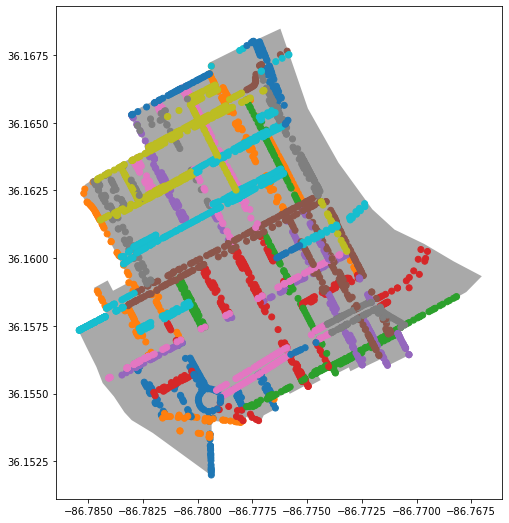

In [69]:
#fig, ax = matplotlib.subplots()
ax = polygon_cbid.plot(figsize = (8, 10), color = 'darkgrey')
sidewalks_in_cbid.plot( ax = ax, column = 'routeid');
plt.show();

In [70]:
polygon_cbid.geometry.centroid

<ipython-input-70-635a501d0105>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygon_cbid.geometry.centroid


0    POINT (-86.77781 36.16002)
dtype: geometry

In [71]:
#find the center of the larger (more southern) polygon and look at it
center = polygon_cbid.geometry.centroid[0]
print(center)

POINT (-86.77781481021385 36.16002306452109)


<ipython-input-71-f788ebe47926>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = polygon_cbid.geometry.centroid[0]


In [72]:
# reverse the order when constructing the array for folium location
area_center = [center.y, center.x]

# check the order of area_center, the location for our folium map
print(area_center)

[36.16002306452109, -86.77781481021385]


In [74]:
#create our map of Nashville Zip Code 37207 and show it
map_cbid = folium.Map(location =  area_center, zoom_start = 12)
map_cbid

In [75]:
i = 0
for row_index, row_values in sidewalks_out_in_improvement_area.iterrows():
    if i <3: 
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 15858
values are:
 
evnt_lat                                  36.14921978
obj_pot                                          None
side                                                W
measure                                           136
curbtype                                         None
evnt_lon                                 -86.77924271
sw_mat_ty                                        None
drv_ld                                              0
cr_slp                                           None
event_subt                                      POINT
drv_cs_d                                         None
repaired                                           NA
fur_zn_w                                            0
sw_width                                            0
evnt_type                                CONC_DEFECTS
drv_ti_mat                                       None
from                                      Division St
obj_hgt                                          None

In [89]:
#draw our zip code area: 37207
map_cbid = folium.Map(location =  area_center, zoom_start = 15)

folium.GeoJson(polygon_cbid).add_to(map_cbid)

#iterate through stops_in_37207 to create locations and markers 
#for each bus stop
#remember for Folium locations, lat is listed first!!

for row_index, row_values in sidewalks_out_in_improvement_area.iterrows():
    loc = [row_values['evnt_lat'], row_values['evnt_lon']]
    pop = str(row_values['routeid'])
    icon=folium.Icon(color='lightred',icon="flag-o", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(map_cbid)
map_cbid.save('../maps/map_cbid.html')

#display our map
map_cbid


In [90]:
folium.Map?

In [92]:
cluster_map_cbid = folium.Map(location =  area_center, zoom_start = 15)

#create a marker cluster
marker_cluster = MarkerCluster().add_to(cluster_map_cbid)

folium.GeoJson(polygon_cbid).add_to(cluster_map_cbid)

# inside the loop add each marker to the cluster
for row_index, row_values in sidewalks_out_in_improvement_area.iterrows():
    loc = [row_values['evnt_lat'], row_values['evnt_lon']]
    pop = str(row_values['routeid'])
    icon=folium.Icon(color="blue",icon="flag-o", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)

    
#save an interactive HTML map by calling .save()
cluster_map_cbid.save('../maps/cluster37207.html')

cluster_map_cbid 

In [94]:
#draw our zip code area: 37207
map_cbid = folium.Map(location =  area_center, zoom_start = 15)

folium.GeoJson(polygon_cbid).add_to(map_cbid)

#create a list of locations and pass them to FastMarkerCluster()
locations = sidewalks_out_in_improvement_area[['evnt_lat', 'evnt_lon']].values.tolist()
map_cbid.add_child(
    FastMarkerCluster(locations)
)



#display our map
map_cbid